# Urban Analytics Lab Assignment 2 - 200019239

Github repo: https://github.com/sabimohdnajib/UARepo/tree/main/Lab%20Assignment%202

## Lab 5: Intro to Networks

### Challenge 1

1. Read the GitHub network dataset.
2. Describe using the basic functions of the graph's size. Explore nodes and edges. Provide how many nodes and edges are present in the network
3. Calculate the **degree centrality** of the GitHub collaboration network G. Using the .values() method of the network (e.g. G), extract the degree centrality values and convert them into a list. Then, plot a histogram to visualize the distribution of node degrees in the network.
4. Make a subset of the initial network (e.g. Gh_sub), where you include at least five nodes and their corresponding edges. Experiment with multiple nodes so you have a graph with enough edges to work on.
5. Plot the subset graph created.
6. Now calculate another relevant measure of the network -- **betweenness centrality**. Plot the betweenness centrality distribution of the subset you created. Tip: Same steps from the previous step, but use `nx.betweenness_centrality()`
7. Plot the Matrix, Arc and Circos from the subset.

In [36]:
#Importing relevant plugins
import nxviz as nv
import pickle
import networkx as nx
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore', DeprecationWarning)
warnings.filterwarnings('ignore')

In [7]:
#Reading the GitHub network dataset
with open('/data/github_users.p', 'rb') as f:
    G = pickle.load(f)
G

In [8]:
#Exploring the graph
print(len(G)) #Size of the graph (56519)

#Showing the attribute of the first element in edges list
print(list(G.edges(data=True))[0])
# ('u1', 'u3124', {})

#Attribute of the first element in the node list
print(list(G.nodes(data=True))[0])
# ('u1', {'bipartite': 'users'})

56519
('u1', 'u3124', {})
('u1', {'bipartite': 'users'})


In [9]:
#Type of edges
print(type(list(G.edges(data=True))[-1][2]))

#Type of nodes
print(type(G.nodes()))

<class 'dict'>
<class 'networkx.classes.reportviews.NodeView'>


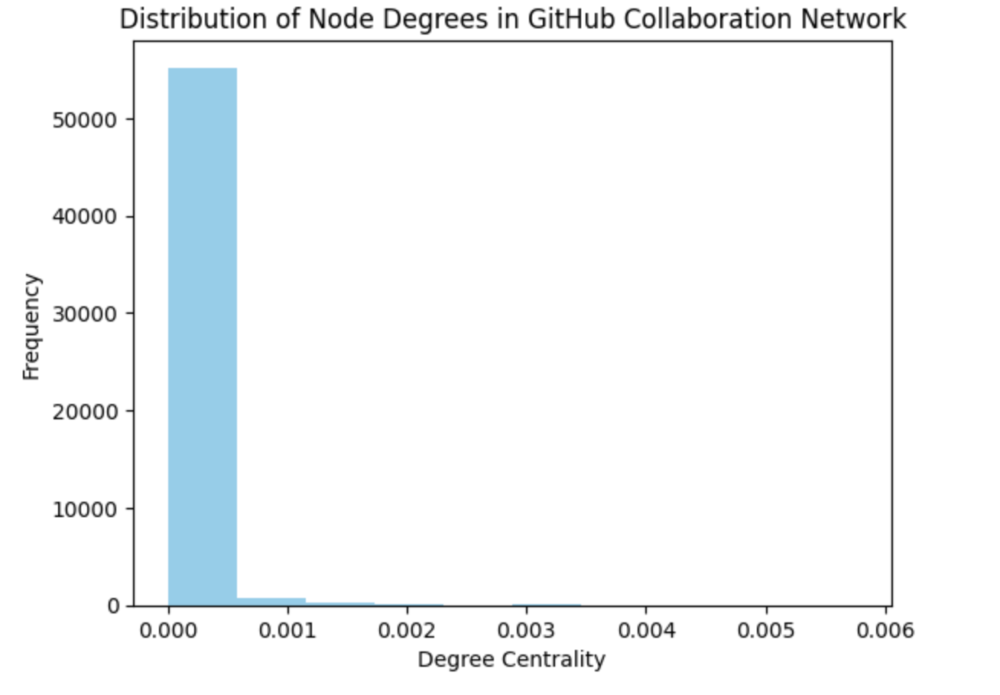

In [ ]:
list(G.edges) #Checking to see the names of the edges
#Output cell was cleared as it was very long

In [ ]:
#Subsetting edges from selected nodes
edges_G=G.edges(['u1','u5','u10','u15','u20','u25','u30'])
print(edges_G)

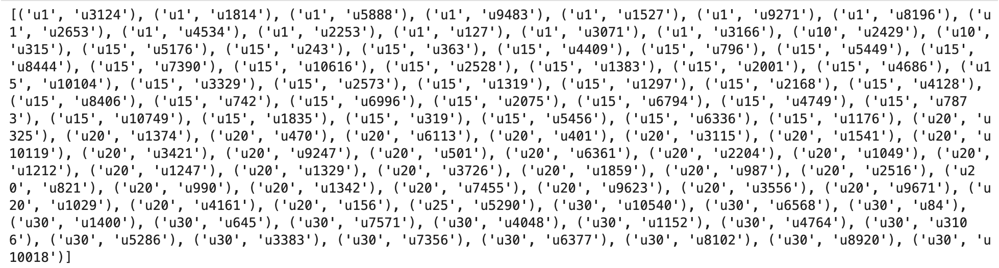

In [ ]:
#Creating an empty list
gh_sub = nx.DiGraph()

gh_sub.add_edges_from(edges_G) #Adding the list from the subset of nodes.
len(gh_sub) #There are 103 edges for the 7 edges

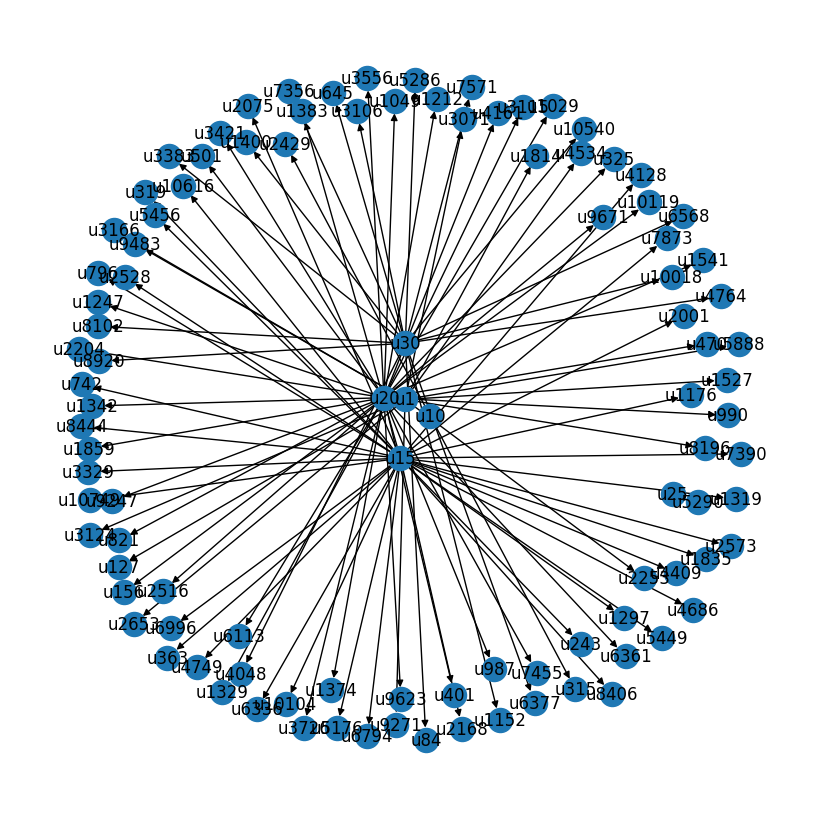

In [14]:
#Plotting a graph for the subset of nodes with their edges
plt.figure(figsize=(8, 8))
nx.draw(gh_sub, with_labels=True)
plt.show()

In [15]:
#Getting betweenness centrality
betweenness_centrality = nx.betweenness_centrality(gh_sub)

In [ ]:
#Creating a plot for each node
for node, centrality in betweenness_centrality.items():
    print(f"Node {node}: Betweenness Centrality = {centrality:.3f}")

# Plot the graph for betweenness centrality
pos = nx.spring_layout(gh_sub)
nx.draw(gh_sub, pos, with_labels=True, node_size=300, node_color='skyblue')
plt.title('Graph subset of G with Betweenness Centrality')
plt.show()

In [ ]:
#Plotting the Matrix for gh_sub
nv.MatrixPlot(gh_sub)
plt.show()

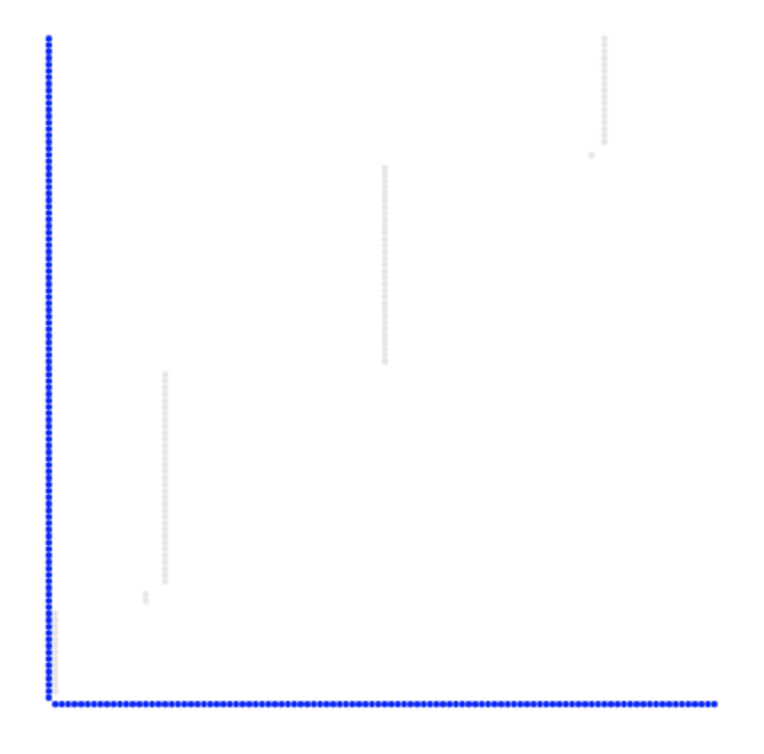

In [ ]:
#Plotting Arc for the subset
nv.ArcPlot(gh_sub)
plt.show()

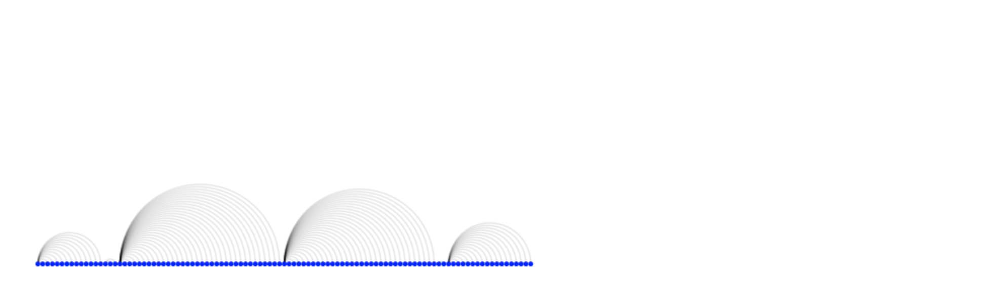

In [ ]:
#Plotting the Circos for gh_sub
nv.CircosPlot(gh_sub)
plt.show()

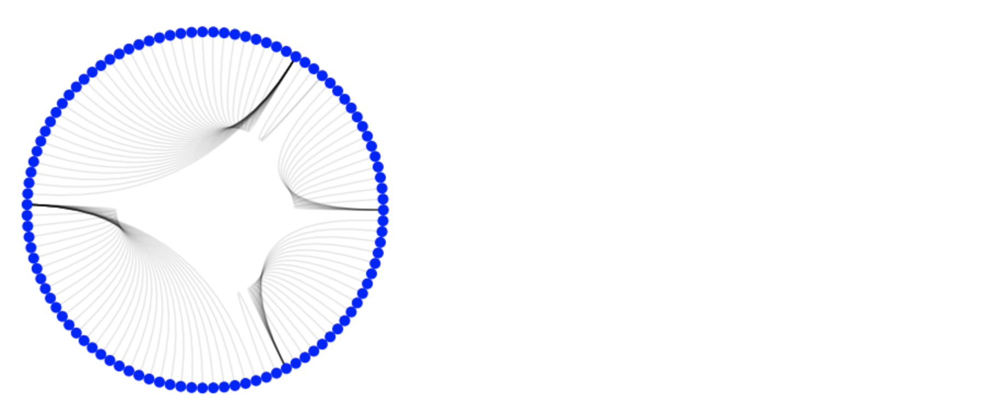

### Challenge 2

1. Use OSMnx to download the street network of a city of your choice. You can specify the city name, BBox or a Dict.
2. Calculate basic statistics for the street network, such as the number of nodes, edges, average node degree, etc.
3. Use OSMnx to plot the street network. Customize the plot to make it visually appealing, including node size, edge color. See the potential options here: https://osmnx.readthedocs.io/en/stable/user-reference.html#module-osmnx.plot
4. Utilize the routing capabilities of OSMnx to find the shortest path between two points in the street network. Plot the route on top of the street network.
5. Calculate the centrality measures (e.g., degree centrality and betweenness_centrality) for nodes in the street network.
6. Create the figure-groud from the selected city
7. Create interactive maps to plot nodes, edges, nodes+edges and one of the centrality measures.
8. Export the street network to a GeoPackage (.gpkg) file. Ensure that the exported file contains both node and edge attributes. Demonstrate that the new GeoPackage can be used and read in Python using any of the libraries we have seen in the class to create a simple and interactive map.
9. Finally, use OSMnx to extract other urban elements (e.g., buildings, parks) and plot them.

In [22]:
#BBox to load a map of Kuala Lumpur
kuala_lumpur = (3.1319, 101.6841)
one_mile = 1609  # meters
kul = ox.graph_from_point(kuala_lumpur, dist=one_mile, network_type="drive")

In [ ]:
#Calculating basic statistics for Kuala Lumpur street network
ox.basic_stats(kul, area=one_mile, clean_int_tol=15)

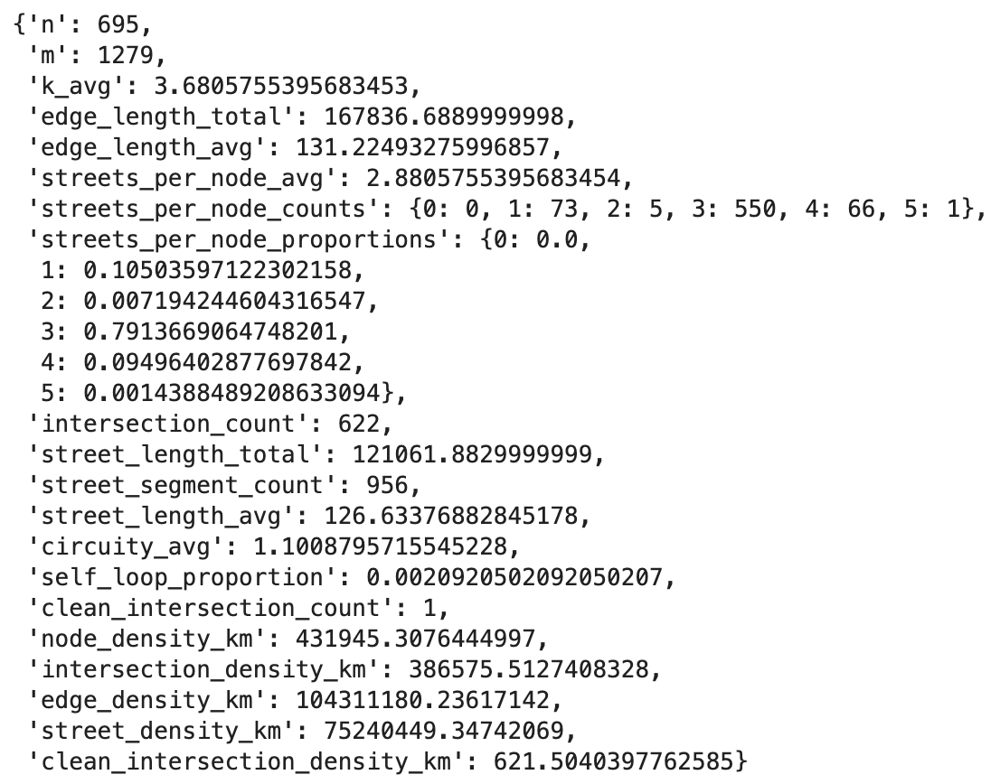

In [ ]:
#Plotting the street network
fig, ax = ox.plot_graph(kul, node_size=15, edge_color='green', bgcolor='white')

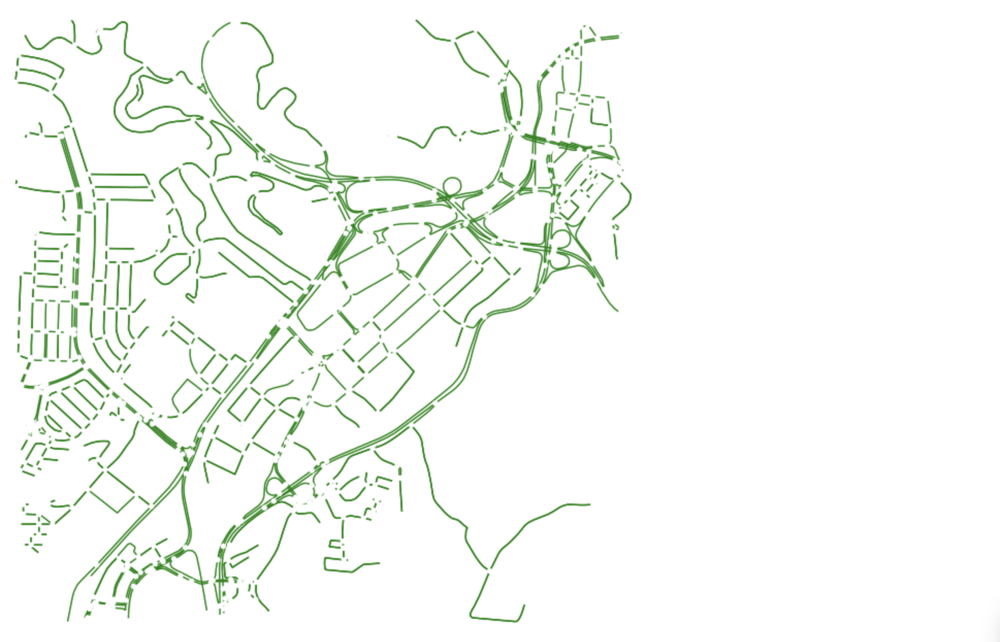

In [25]:
#Finding the shortest path between two points in the street network
#Nearest network nodes from the Muzium Negara MRT Stationn to the PWC Office
mn_station = ox.distance.nearest_nodes(kul, X=101.6876, Y=3.1374)
pwc_office = ox.distance.nearest_nodes(kul, X=101.6834, Y=3.1313)

In [ ]:
#Finding which route is the shortest between the two and plotting it on map
kul_route = ox.shortest_path(kul, mn_station, pwc_office, weight="travel_time")
fig, ax = ox.plot_graph_route(kul, kul_route, node_size=0)

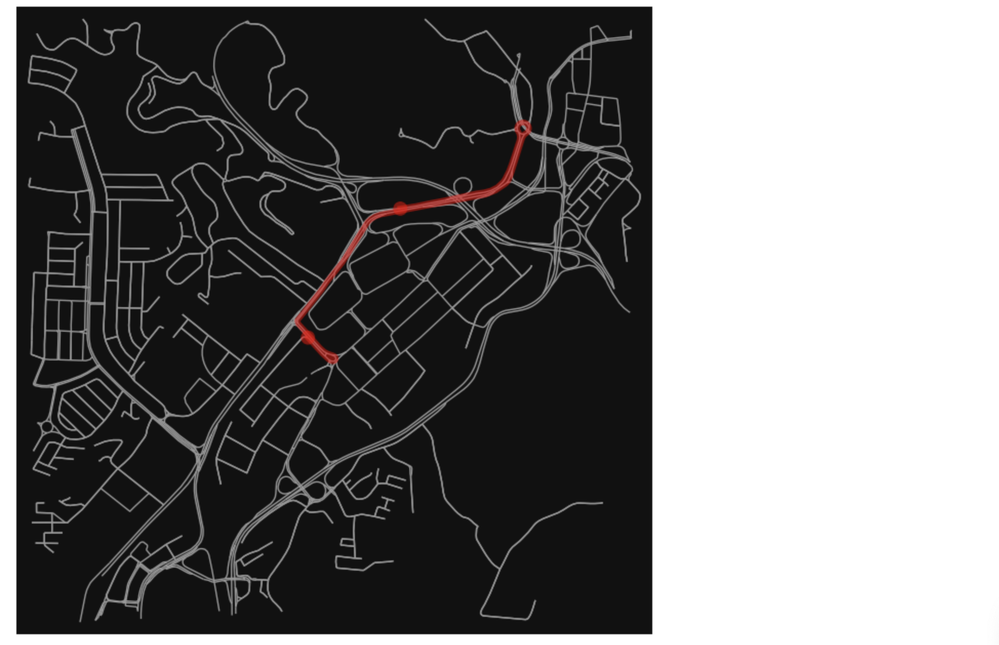

In [ ]:
#Degree centrality of Kuala Lumpur
kul_degree_centrality = nx.degree_centrality(kul)

#Printing the list
for node, centrality in kul_degree_centrality.items():
    print(f"Node {node}: Degree Centrality = {centrality:.3f}")

In [ ]:
#Plot the graph for degree centrality
import matplotlib.pyplot as plt

kul_pos_d = nx.spring_layout(kul)
nx.draw(kul, kul_pos_d, with_labels=True, node_size=700, node_color='skyblue')
plt.title('Graph with Degree Centrality of Map of Kuala Lumpur')
plt.show()

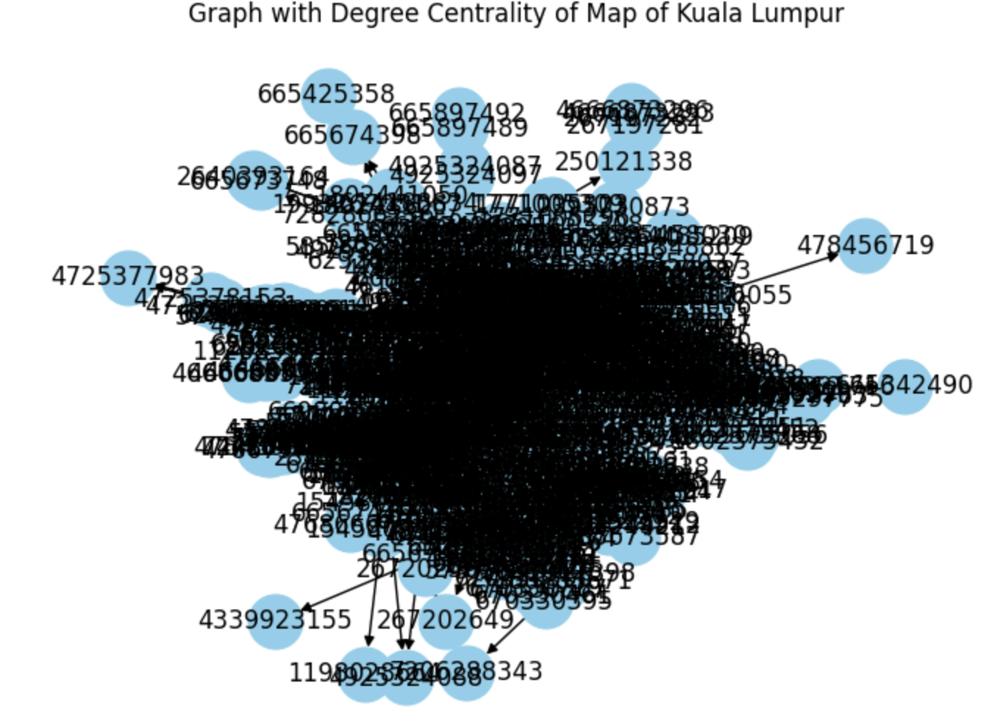

In [29]:
#Betweenness centrality of Kuala Lumpur
kul_betweenness_centrality = nx.betweenness_centrality(kul)

In [ ]:
#Printing betweenness centrality for each node
for node, centrality in kul_betweenness_centrality.items():
    print(f"Node {node}: Betweenness Centrality = {centrality:.3f}")

#Plotting the graph for betweenness centrality
kul_pos_b = nx.spring_layout(kul)
nx.draw(kul, kul_pos_b, with_labels=True, node_size=300, node_color='skyblue')
plt.title('Graph subset of Kuala Lumpur with Betweenness Centrality')
plt.show()

In [ ]:
#Plotting the figure ground for Kuala Lumpur
fig, ax = ox.plot_figure_ground(kul, dpi=400)

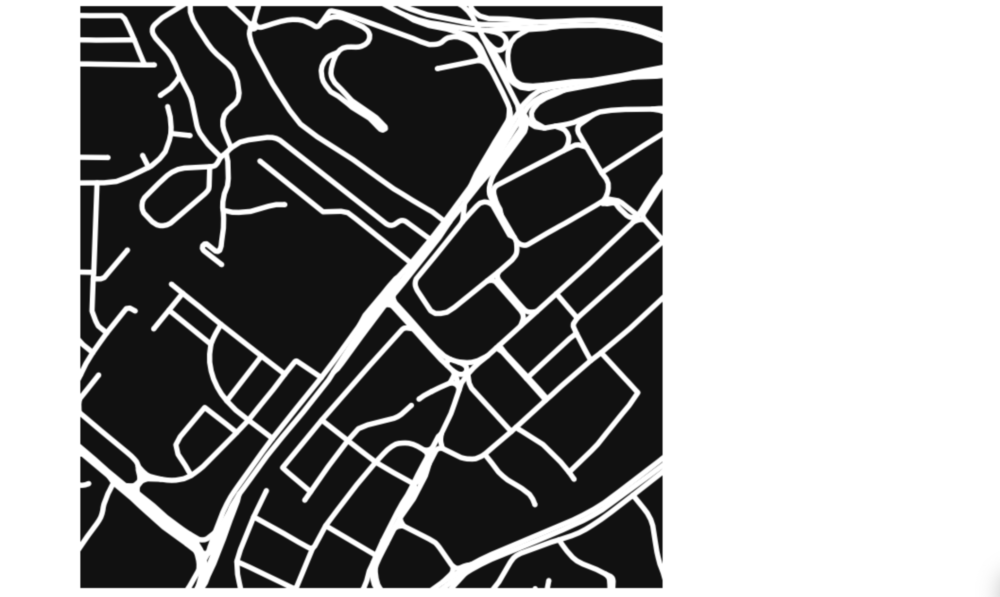

In [ ]:
#Interactive map nodes of Kuala Lumpur coloured by betweenness centrality
nx.set_node_attributes(kul, nx.betweenness_centrality(kul, weight="length"), name="bc")
nodes = ox.graph_to_gdfs(kul, edges=False)
nodes.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 8})

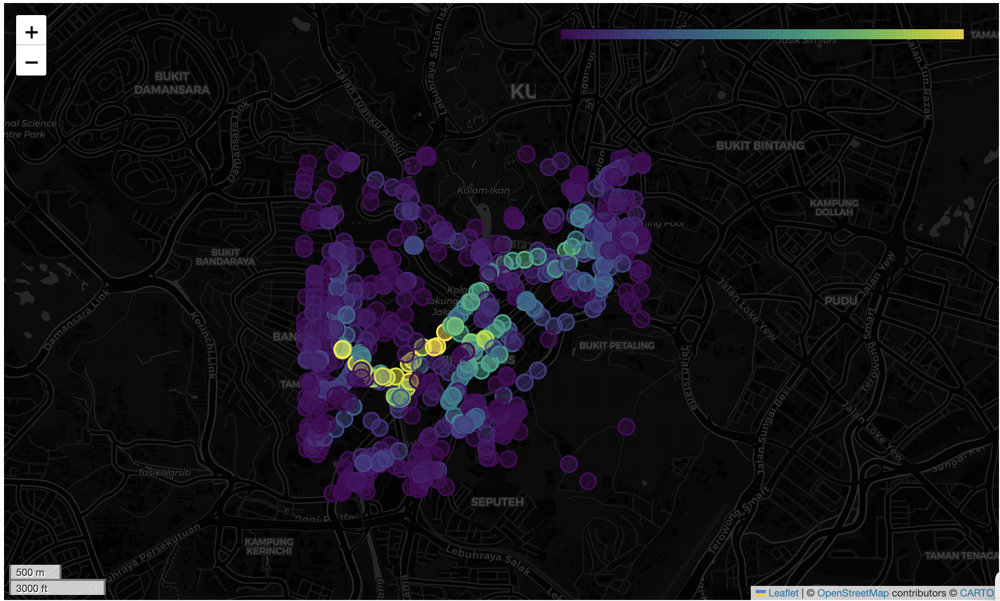

In [33]:
#Exporting the street network to a GeoPackage
ox.save_graph_geopackage(kul, filepath="./data/kualalumpur.gpkg")

In [34]:
#Seeing the building footprints in Kuala Lumpur
kul_loc = "Kuala Lumpur, Malaysia"
tags = {"building": True}
kul_gdf = ox.geometries_from_place(kul_loc, tags)
kul_gdf.shape

/var/folders/zg/jw_qspdj65b2ls0920mvbyp40000gp/T/ipykernel_8809/2643561545.py:4: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release.
  kul_gdf = ox.geometries_from_place(kul_loc, tags)


(98842, 338)

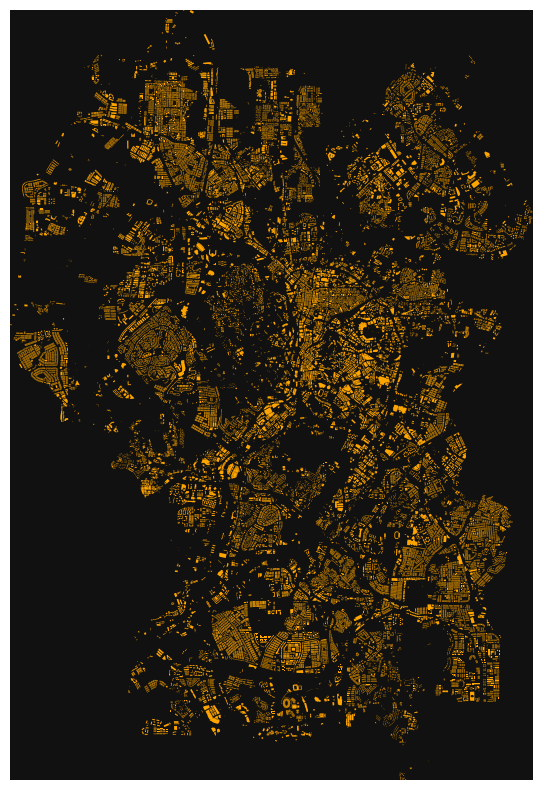

In [38]:
#Plotting the building footprints in Kuala Lumpur
warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(kul_gdf, figsize=(12, 10))

## Lab 6: Geodemographics and Intro to Spatial Microsimulation

### Challenge 1

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

### Preparing the dataset

In [120]:
#Importing presets
import pandas as pd
import os
import geopandas as gpd

#Establishing csv data directory
csv_directory = "/Users/sabrinanajib/Downloads/GG4257/UARepo/Lab 6/edinburgh"

#Get the list of all the csv files
csv_files = [file for file in os.listdir(csv_directory) if file.endswith(".csv")]

#Creating an empty dataframe to store the data
merged_data = pd.DataFrame()

#Looping through the csv files to merge them into a dataframe
for csv_file in csv_files:
    csv_path = os.path.join(csv_directory, csv_file)
    df_csv = pd.read_csv(csv_path, low_memory=False) 
#merging all the data together
    merged_data = pd.concat([merged_data, df_csv], axis=1)

#saving the merged dataset
merged_data.to_csv("/Users/sabrinanajib/Downloads/GG4257/UARepo/Lab 6/edinburgh/edi_census_data.csv", index=False)

In [ ]:
list(merged_data.columns) #Listing out all the variables

In [122]:
merged_data.head() #Looking at the first few columns of the merged data

,OA_CODE,All people,0 to 4,5 to 7,8 to 9,10 to 14,15,16 to 17,18 to 19,20 to 24,...,"Caribbean or Black: Caribbean, Caribbean Scottish or Caribbean British.1","Caribbean or Black: Black, Black Scottish or Black British.1",Caribbean or Black: Other Caribbean or Black.1,Other ethnic groups.1,"Other ethnic groups: Arab, Arab Scottish or Arab British.1",Other ethnic groups: Other ethnic group.1,Unnamed: 0.6,All people.3,Males.1,Females.1
0,S00103303,61,2,2,3,5,-,1,2,5,...,-,-,-,-,-,-,S00103303,61,30,31
1,S00103304,153,11,8,4,8,1,5,2,6,...,-,-,-,-,-,-,S00103304,153,75,78
2,S00103305,73,3,1,4,5,-,3,1,1,...,-,-,-,-,-,-,S00103305,73,38,35
3,S00103306,86,4,7,2,7,2,1,2,1,...,-,-,-,-,-,-,S00103306,86,42,44
4,S00103307,86,1,-,1,4,-,4,2,-,...,-,-,-,-,-,-,S00103307,86,46,40


In [123]:
#Checking for missing data
missing_counts = merged_data.isnull().sum()
print(missing_counts) #There is no missing data

OA_CODE                                      0
All people                                   0
0 to 4                                       0
5 to 7                                       0
8 to 9                                       0
                                            ..
Other ethnic groups: Other ethnic group.1    0
Unnamed: 0.6                                 0
All people.3                                 0
Males.1                                      0
Females.1                                    0
Length: 424, dtype: int64


In [98]:
os.environ['SHAPE_RESTORE_SHX'] = 'YES'
#Responding to the drive error mentioned earlier

In [108]:
#Reading shapefile of output areas in scotland
dbf_path = "/Users/sabrinanajib/Downloads/GG4257/UARepo/Lab 6/edinburgh/OutputArea2011_EoR.dbf"
dbf_gpd = gpd.read_file(dbf_path)

In [109]:
dbf_gpd.head() #Looking at the columns and first few rows

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,SHAPE_1_Le,SHAPE_1_Ar,CA_CODE,OA_CODE,AREA_SQKM,AREA_HA,OA_TOTPOP,OA_RESPOP,OA_HHCOUNT,geometry
0,1,S00089001,55,115,S12000033,0.029184,2.918398,AB11 7XY,393374,805012,929.786180,29183.980141,S12000033,S00089001,0.029184,2.918398,115,0,0,"POLYGON ((393462.941 804843.122, 393457.026 80..."
1,2,S00090016,50,100,S12000033,0.017122,1.712225,AB16 7SX,389779,808556,745.621044,17122.247009,S12000033,S00090016,0.017122,1.712225,100,0,0,"POLYGON ((389835.000 808443.000, 389798.000 80..."
2,3,S00089741,45,109,S12000033,0.045336,4.533582,AB15 4AH,391312,805970,1156.172057,45335.819961,S12000033,S00089741,0.045336,4.533582,109,0,0,"POLYGON ((391366.261 806105.203, 391370.124 80..."
3,4,S00088978,33,60,S12000033,0.033488,3.348824,AB10 1SB,393473,806017,1173.627495,33488.237428,S12000033,S00088978,0.033488,3.348824,60,0,0,"POLYGON ((393557.291 806046.379, 393567.717 80..."
4,5,S00090442,64,97,S12000033,0.012945,1.294538,AB24 1TA,394564,808271,615.199658,12945.377768,S12000033,S00090442,0.012945,1.294538,97,0,0,"POLYGON ((394661.000 808286.000, 394659.000 80..."


In [110]:
#Filtering so it's only edinburgh output areas
#Creating a column without the S
dbf_gpd['oa_number'] = dbf_gpd['OA_CODE'].str[1:]

In [ ]:
dbf_gpd.head() #Checking it worked

In [115]:
dbf_gpd['oa_number'] = dbf_gpd['oa_number'].astype(int) #Changing so it is an integer

In [116]:
#Only keeping the rows with edinburgh output area codes
#Obtained this info from https://www.opendata.nhs.scot/dataset/geography-codes-and-labels/resource/395476ab-0720-4740-be07-ff4467141352
filtered_gdf = dbf_gpd[(dbf_gpd['oa_number'] >= 103303) & (dbf_gpd['oa_number'] <= 107624)]
filtered_gdf.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,SHAPE_1_Ar,CA_CODE,OA_CODE,AREA_SQKM,AREA_HA,OA_TOTPOP,OA_RESPOP,OA_HHCOUNT,geometry,oa_number
7301,7307,S00104290,35,80,S12000036,0.005849,0.584871,EH6 8AJ,327509,675739,...,5848.713328,S12000036,S00104290,0.005849,0.584871,80,0,0,"POLYGON ((327537.774 675742.146, 327540.000 67...",104290
7302,7308,S00105247,50,134,S12000036,0.015458,1.545845,EH11 3UN,319980,671252,...,15458.448430,S12000036,S00105247,0.015458,1.545845,134,0,0,"POLYGON ((319979.000 671269.000, 319999.520 67...",105247
7303,7309,S00107429,45,72,S12000036,0.012086,1.208595,EH14 1DD,322954,670960,...,12085.954421,S12000036,S00107429,0.012086,1.208595,72,0,0,"POLYGON ((322988.000 671045.000, 323000.000 67...",107429
7304,7310,S00105740,45,104,S12000036,0.372084,37.208371,EH14 1DN,322537,669850,...,372083.705263,S12000036,S00105740,0.372084,37.208371,104,0,0,"POLYGON ((322698.000 670222.000, 322723.000 67...",105740
7305,7311,S00105450,46,87,S12000036,0.021571,2.157070,EH12 6AN,323001,673215,...,21570.704000,S12000036,S00105450,0.021571,2.157070,87,0,0,"POLYGON ((323112.000 673294.999, 323133.001 67...",105450


In [117]:
#Checking the filtered data consists of all the output areas
row_count = len(filtered_gdf)
print("Number of rows:", row_count) #It does as there are 4322 output areas in Edinburgh

Number of rows: 4322


In [124]:
csv_path = "/Users/sabrinanajib/Downloads/GG4257/UARepo/Lab 6/edinburgh/edi_census_data.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)

# Merging the GeoDataFrame with the DataFrame based on the oa_code
map_and_gdf = filtered_gdf.merge(csv_data)

### Standardisation of the areas

In [203]:
#Calculating percentages of important variables
def calculate_percentages(dataframe, total_columns, value_columns):

    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        # The data have several empty values, so you need to process them, forcing them to be a numeric or NaN value
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        result_df[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df

# List of the totals.
total_cols = ['All people aged 16 to 74',
              'All people aged 16 to 74',
              'All people',
              'All people',
              'All people']
# List of the values. 
value_cols = ['All people aged 16 and over: Level 4 and above',
              'All people aged 16 to 74 in employment',
              'Church of Scotland',
              'Roman Catholic',
              'Other Christian']

result_dataframe = calculate_percentages(map_and_gdf, total_cols, value_cols)

In [204]:
result_dataframe.head() #Checking the first few rows

,All people aged 16 and over: Level 4 and above_percentage,All people aged 16 to 74 in employment_percentage,Church of Scotland_percentage,Roman Catholic_percentage,Other Christian_percentage
0,44.262295,78.688525,26.250000,16.250000,5.000000
1,14.285714,61.224490,24.626866,10.447761,4.477612
2,73.529412,64.705882,31.944444,9.722222,22.222222
3,60.000000,60.000000,35.576923,12.500000,3.846154
4,76.388889,84.722222,25.287356,14.942529,3.448276


In [205]:
# Concatenate the resulting tables
concatenated_df = pd.concat([map_and_gdf, result_dataframe], axis=1, ignore_index=False)
concatenated_df.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,Other ethnic groups: Other ethnic group.1,Unnamed: 0.6,All people.3,Males.1,Females.1,All people aged 16 and over: Level 4 and above_percentage,All people aged 16 to 74 in employment_percentage,Church of Scotland_percentage,Roman Catholic_percentage,Other Christian_percentage
0,7307,S00104290,35,80,S12000036,0.005849,0.584871,EH6 8AJ,327509,675739,...,-,S00104290,80,42,38,44.262295,78.688525,26.250000,16.250000,5.000000
1,7308,S00105247,50,134,S12000036,0.015458,1.545845,EH11 3UN,319980,671252,...,-,S00105247,134,69,65,14.285714,61.224490,24.626866,10.447761,4.477612
2,7309,S00107429,45,72,S12000036,0.012086,1.208595,EH14 1DD,322954,670960,...,-,S00107429,72,30,42,73.529412,64.705882,31.944444,9.722222,22.222222
3,7310,S00105740,45,104,S12000036,0.372084,37.208371,EH14 1DN,322537,669850,...,-,S00105740,104,49,55,60.000000,60.000000,35.576923,12.500000,3.846154
4,7311,S00105450,46,87,S12000036,0.021571,2.157070,EH12 6AN,323001,673215,...,-,S00105450,87,38,49,76.388889,84.722222,25.287356,14.942529,3.448276


### Standardisation between variables

In [206]:
# Calculate z-score for each column

numeric_columns = concatenated_df.select_dtypes(include='float64')
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

,sqkm,hect,SHAPE_1_Le,SHAPE_1_Ar,AREA_SQKM,AREA_HA,All people,Mean age,All people aged 16 to 74,All people aged 16 and over: Level 4 and above,...,Roman Catholic,Other Christian,Mean age.3,Mean age.2,Mean age.1,All people aged 16 and over: Level 4 and above_percentage,All people aged 16 to 74 in employment_percentage,Church of Scotland_percentage,Roman Catholic_percentage,Other Christian_percentage
0,-0.094350,-0.094351,-0.240792,-0.094445,-0.094350,-0.094351,-0.773245,0.034260,-0.760581,-0.469061,...,-0.048562,-0.496891,0.034260,0.034260,0.034260,-0.050999,1.058985,0.164675,0.709089,-0.471323
1,-0.077890,-0.077889,-0.021891,-0.078613,-0.077890,-0.077889,0.641188,-0.185279,0.418830,-0.986551,...,0.062077,-0.247104,-0.185279,-0.185279,-0.185279,-1.353818,-0.268694,0.031589,-0.321718,-0.590874
2,-0.083666,-0.083666,-0.205971,-0.084169,-0.083666,-0.083666,-0.982791,2.823694,-1.621233,-0.548674,...,-0.712392,1.001829,2.823694,2.823694,2.823694,1.220985,-0.004026,0.631580,-0.450615,3.470044
3,0.533001,0.533000,2.655306,0.508919,0.533001,0.533000,-0.144608,1.041556,0.004442,0.486306,...,-0.048562,-0.496891,1.041556,1.041556,1.041556,0.632980,-0.361784,0.929418,0.042876,-0.735385
4,-0.067419,-0.067419,-0.124546,-0.068543,-0.067419,-0.067419,-0.589893,-0.262763,-0.409946,0.645534,...,-0.048562,-0.621785,-0.262763,-0.262763,-0.262763,1.345261,1.517688,0.085745,0.476808,-0.826441


### Checking relationship between variables

In [207]:
corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,sqkm,hect,SHAPE_1_Le,SHAPE_1_Ar,AREA_SQKM,AREA_HA,All people,Mean age,All people aged 16 to 74,All people aged 16 and over: Level 4 and above,All people aged 16 to 74 in employment,Church of Scotland,Roman Catholic,Other Christian,Mean age.3,Mean age.2,Mean age.1,All people aged 16 and over: Level 4 and above_percentage,All people aged 16 to 74 in employment_percentage,Church of Scotland_percentage,Roman Catholic_percentage,Other Christian_percentage
sqkm,1.000000,1.000000,0.855194,0.990655,1.000000,1.000000,0.034167,0.026658,0.019934,0.028179,0.036955,0.065408,-0.003769,0.082548,0.026658,0.026658,0.026658,-0.001099,0.020421,0.049803,-0.059369,0.084952
hect,1.000000,1.000000,0.855194,0.990655,1.000000,1.000000,0.034167,0.026658,0.019934,0.028179,0.036955,0.065408,-0.003769,0.082548,0.026658,0.026658,0.026658,-0.001099,0.020421,0.049803,-0.059369,0.084952
SHAPE_1_Le,0.855194,0.855194,1.000000,0.865550,0.855194,0.855194,0.133060,0.115078,0.070823,0.067716,0.071648,0.210259,0.039590,0.130397,0.115078,0.115078,0.115078,0.002918,-0.003908,0.155656,-0.096639,0.075330
SHAPE_1_Ar,0.990655,0.990655,0.865550,1.000000,0.990655,0.990655,0.031524,0.027944,0.017971,0.025524,0.035383,0.063744,-0.003909,0.080315,0.027944,0.027944,0.027944,-0.002373,0.022026,0.050130,-0.059652,0.085377
AREA_SQKM,1.000000,1.000000,0.855194,0.990655,1.000000,1.000000,0.034167,0.026658,0.019934,0.028179,0.036955,0.065408,-0.003769,0.082548,0.026658,0.026658,0.026658,-0.001099,0.020421,0.049803,-0.059369,0.084952
AREA_HA,1.000000,1.000000,0.855194,0.990655,1.000000,1.000000,0.034167,0.026658,0.019934,0.028179,0.036955,0.065408,-0.003769,0.082548,0.026658,0.026658,0.026658,-0.001099,0.020421,0.049803,-0.059369,0.084952
All people,0.034167,0.034167,0.133060,0.031524,0.034167,0.034167,1.000000,-0.145517,0.912087,0.490672,0.669217,0.527092,0.572858,0.552303,-0.145517,-0.145517,-0.145517,-0.017839,-0.106583,0.033384,-0.048326,0.048465
Mean age,0.026658,0.026658,0.115078,0.027944,0.026658,0.026658,-0.145517,1.000000,-0.318820,-0.150707,-0.333110,0.469789,-0.225412,-0.134867,1.000000,1.000000,1.000000,0.103977,-0.189869,0.718999,-0.186957,-0.053377
All people aged 16 to 74,0.019934,0.019934,0.070823,0.017971,0.019934,0.019934,0.912087,-0.318820,1.000000,0.569796,0.732655,0.288069,0.569180,0.536524,-0.318820,-0.318820,-0.318820,0.003910,-0.056820,-0.173283,0.009467,0.075704
All people aged 16 and over: Level 4 and above,0.028179,0.028179,0.067716,0.025524,0.028179,0.028179,0.490672,-0.150707,0.569796,1.000000,0.638636,0.170695,0.336308,0.594419,-0.150707,-0.150707,-0.150707,0.741124,0.259254,-0.164821,-0.101353,0.344184


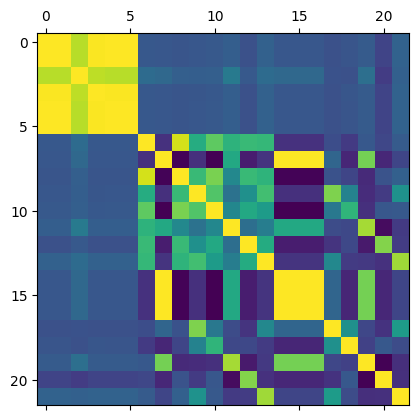

In [208]:
import matplotlib.pyplot as plt

plt.matshow(z_score_df.corr())
plt.show()

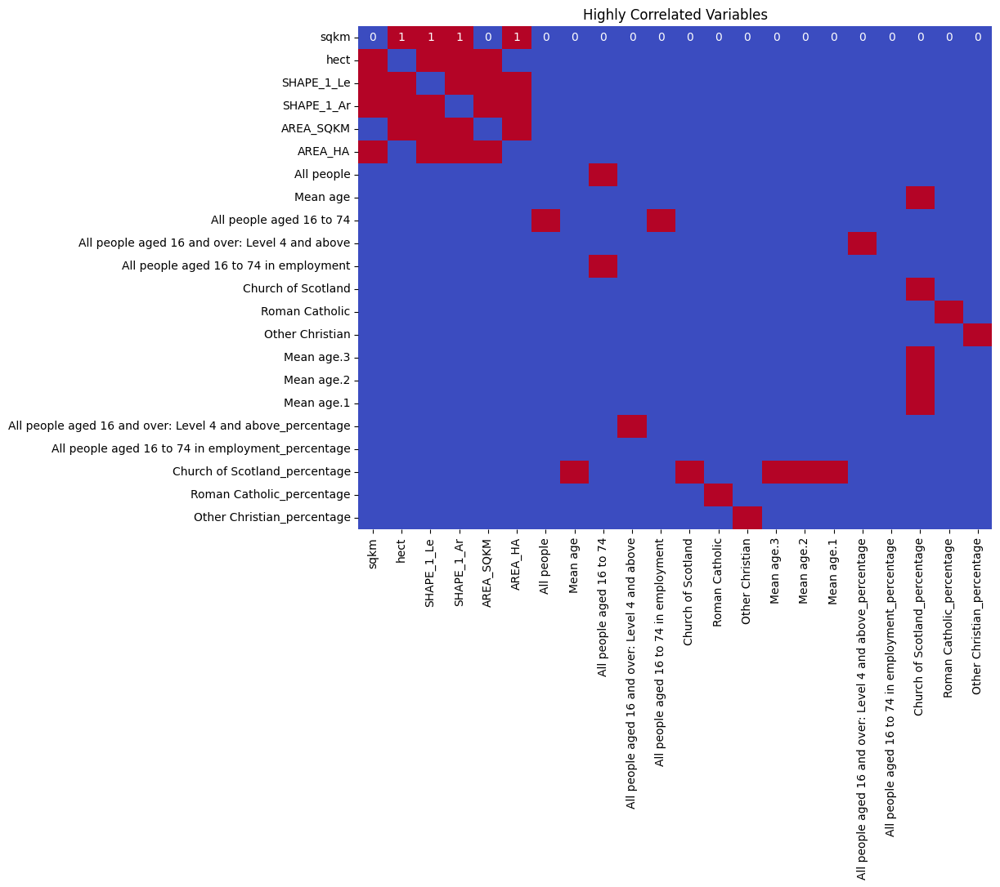

In [209]:
import seaborn as sns
threshold = 0.7 #Declaring the threshold

highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0) #Declaring which variables is considered highly correlated

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show() #Plotting the figure

In [210]:
#Dropping variables with most correlation
z_score_df.drop(['sqkm', 'hect', 'SHAPE_1_Le', 'SHAPE_1_Ar', 'AREA_SQKM', 'AREA_HA',
                'All people aged 16 to 74', 'Church of Scotland_percentage', 'All people aged 16 and over: Level 4 and above_percentage',
                'Roman Catholic', 'Other Christian', 'Roman Catholic_percentage', 'Other Christian_percentage'], axis=1, inplace=True)
z_score_df.info() #As there are different numbers for the variables, that means there are NaN values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4322 entries, 0 to 4321
Data columns (total 9 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   All people                                         4320 non-null   float64
 1   Mean age                                           4322 non-null   float64
 2   All people aged 16 and over: Level 4 and above     4321 non-null   float64
 3   All people aged 16 to 74 in employment             4321 non-null   float64
 4   Church of Scotland                                 4319 non-null   float64
 5   Mean age.3                                         4322 non-null   float64
 6   Mean age.2                                         4322 non-null   float64
 7   Mean age.1                                         4322 non-null   float64
 8   All people aged 16 to 74 in employment_percentage  4319 non-null   float64
dtypes: float6

In [ ]:
corr_2 = z_score_df.corr()
corr_2.style.background_gradient(cmap='coolwarm')

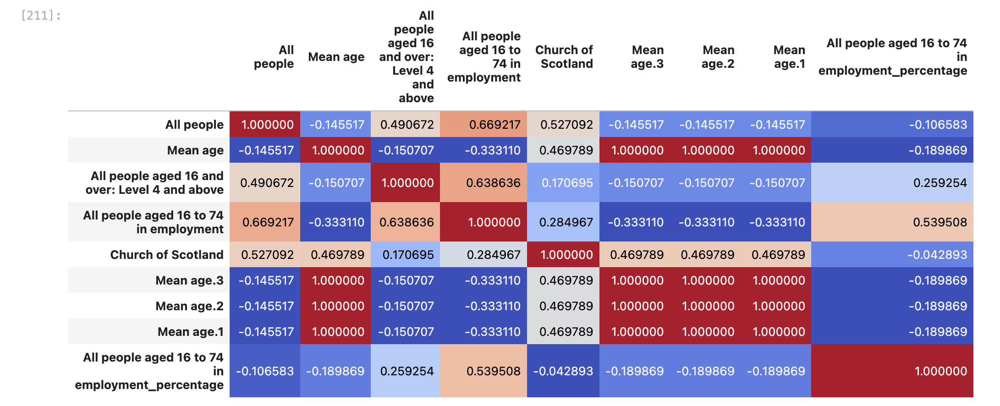

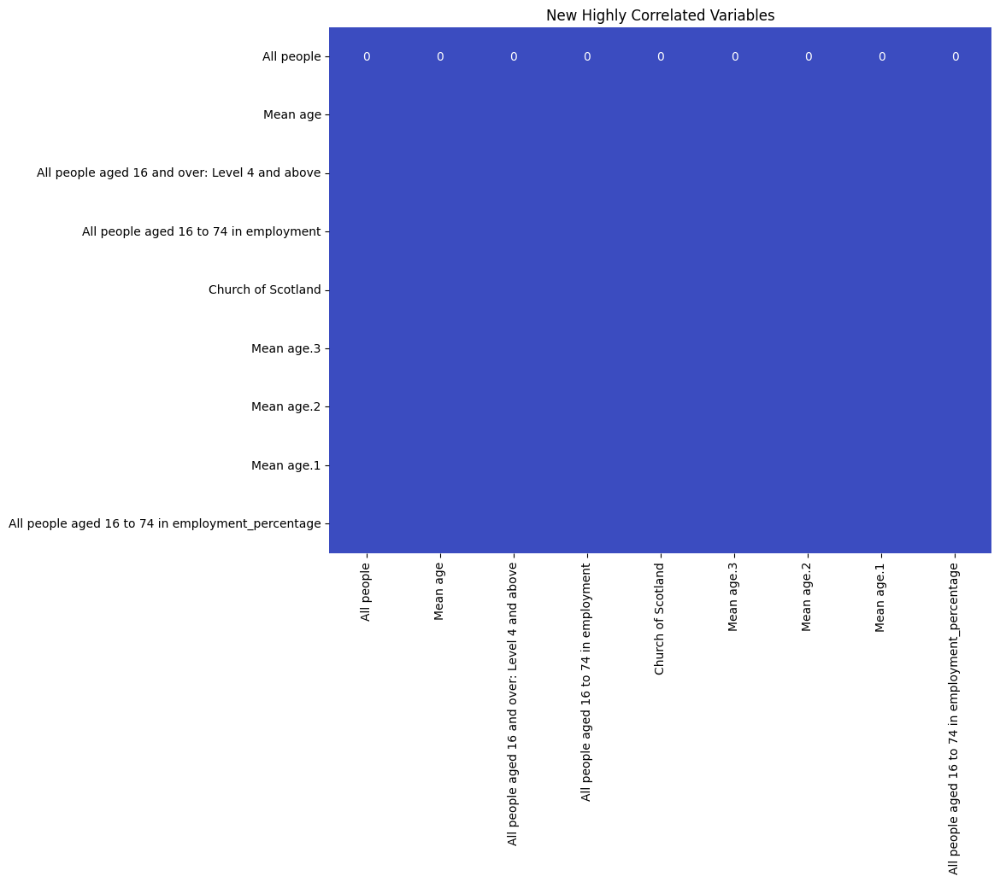

In [212]:
threshold = 0.7
highly_correlated_2 = (corr_2.abs() > threshold) & (corr_2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('New Highly Correlated Variables')
plt.show()

In [213]:
#Getting rid of the NaN values
z_score_df.fillna(z_score_df.mean(), inplace=True)

In [214]:
z_score_df.head()

,All people,Mean age,All people aged 16 and over: Level 4 and above,All people aged 16 to 74 in employment,Church of Scotland,Mean age.3,Mean age.2,Mean age.1,All people aged 16 to 74 in employment_percentage
0,-0.773245,0.034260,-0.469061,-0.334660,-0.343358,0.034260,0.034260,0.034260,1.058985
1,0.641188,-0.185279,-0.986551,0.253490,0.370319,-0.185279,-0.185279,-0.185279,-0.268694
2,-0.982791,2.823694,-0.548674,-1.608984,-0.224411,2.823694,2.823694,2.823694,-0.004026
3,-0.144608,1.041556,0.486306,-0.187622,0.608212,1.041556,1.041556,1.041556,-0.361784
4,-0.589893,-0.262763,0.645534,0.302503,-0.283884,-0.262763,-0.262763,-0.262763,1.517688


In [215]:
z_score_df.shape

(4322, 9)

### K means clustering

In [216]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

# KMeans with 10 clusters
kmeans = KMeans(n_clusters=10)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_
z_score_df['Cluster'] = kmeans.labels_

In [217]:
z_score_df.head()

,All people,Mean age,All people aged 16 and over: Level 4 and above,All people aged 16 to 74 in employment,Church of Scotland,Mean age.3,Mean age.2,Mean age.1,All people aged 16 to 74 in employment_percentage,Cluster
0,-0.773245,0.034260,-0.469061,-0.334660,-0.343358,0.034260,0.034260,0.034260,1.058985,5
1,0.641188,-0.185279,-0.986551,0.253490,0.370319,-0.185279,-0.185279,-0.185279,-0.268694,2
2,-0.982791,2.823694,-0.548674,-1.608984,-0.224411,2.823694,2.823694,2.823694,-0.004026,8
3,-0.144608,1.041556,0.486306,-0.187622,0.608212,1.041556,1.041556,1.041556,-0.361784,3
4,-0.589893,-0.262763,0.645534,0.302503,-0.283884,-0.262763,-0.262763,-0.262763,1.517688,4


In [ ]:
#Plotting it into a histogram
plt.hist(labels)

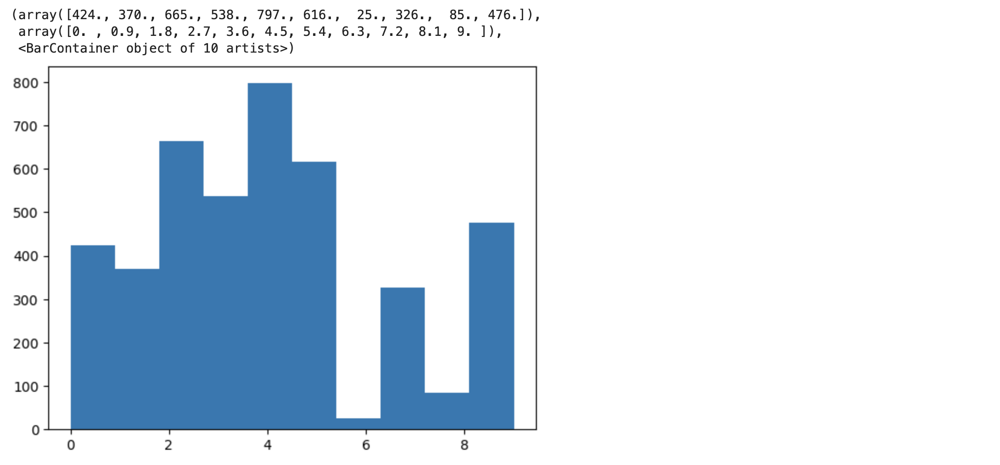

In [ ]:
#Finding the optimum number of clusters
Sum_of_squared_distances = []

K_range = range(1,15)

for k in K_range:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_df)
 Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K_range, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show() #Optimum is around 3, could be 10 as well though

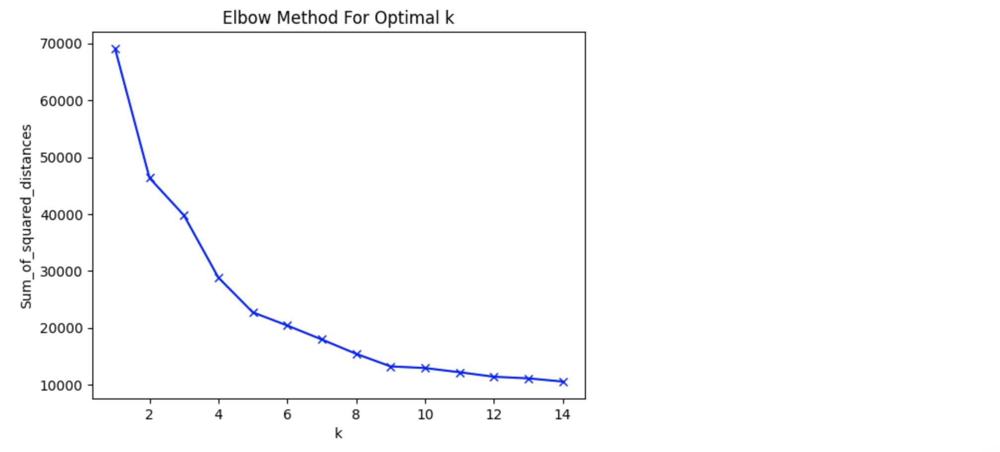

In [220]:
#Creating with 3 clusters
kmeans = KMeans(n_clusters=3)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_

z_score_df['Cluster'] = kmeans.labels_

In [ ]:
plt.hist(labels)

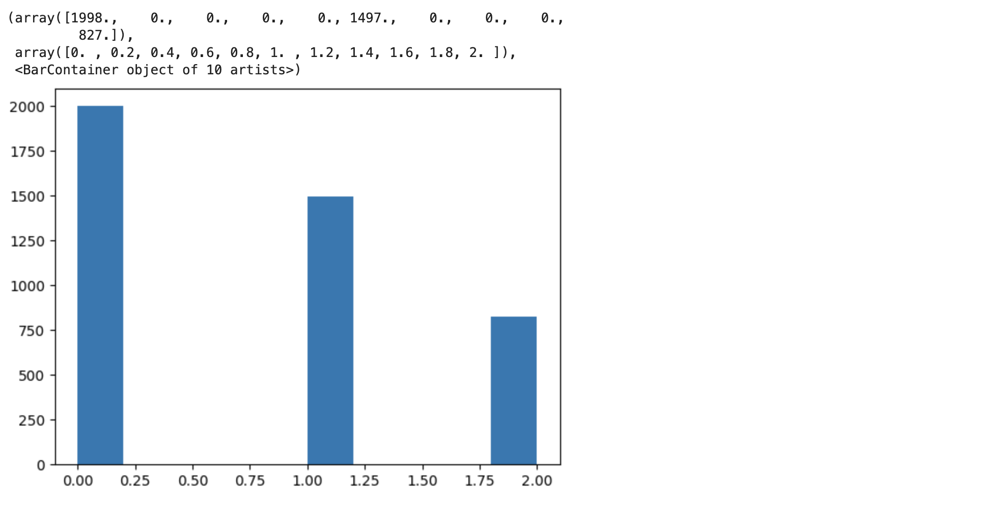

### Evaluating the cluster group

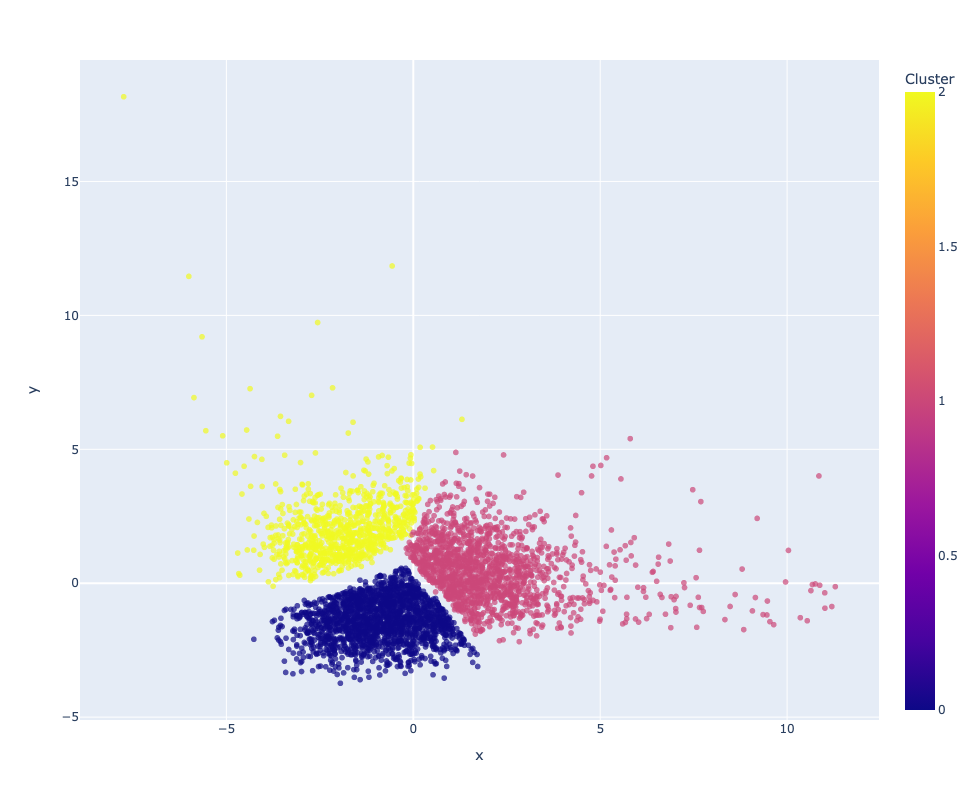

These two components explain 74.17% of the point variability.


<Figure size 1200x800 with 0 Axes>

In [222]:
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

#Plotting the figure
plt.figure(figsize=(12, 8))

#Declaring the cluster
kmeans = KMeans(n_clusters=3)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

#PCA analysis
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Getting the percentage of variance explained
variance_ratio = pca.explained_variance_ratio_

#Creating the scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")


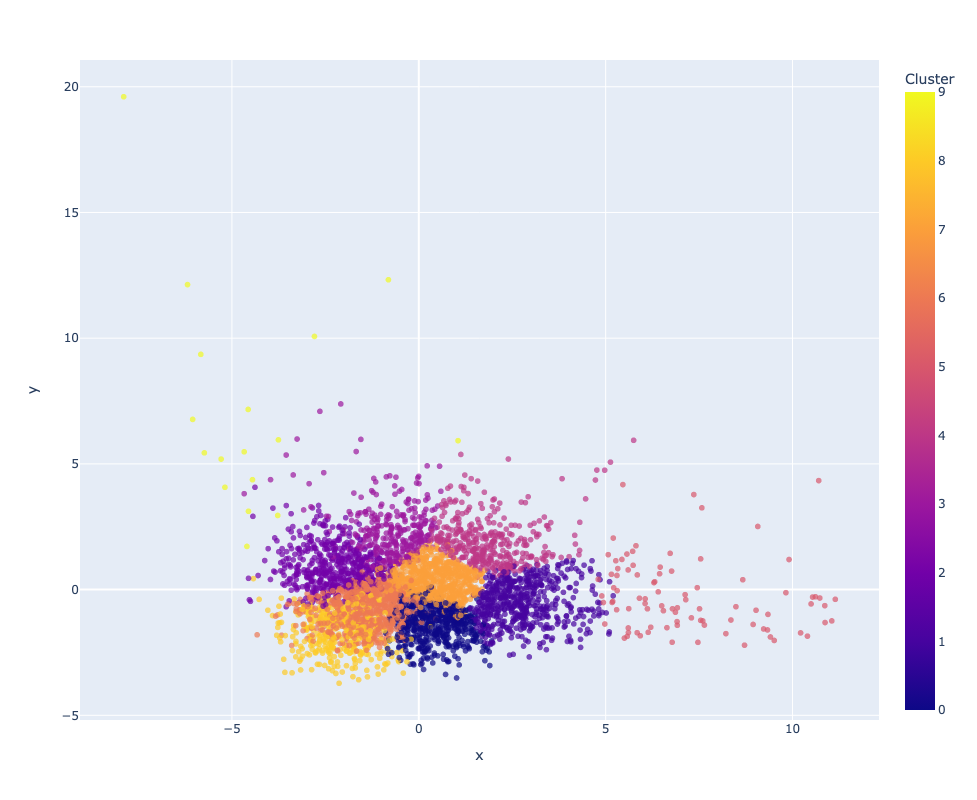

These two components explain 69.70% of the point variability.


<Figure size 1200x800 with 0 Axes>

In [223]:
#Trying the same thing but with 10 to see if there's a difference
#Plotting the figure
plt.figure(figsize=(12, 8))

#Declaring the cluster
kmeans = KMeans(n_clusters=10)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

#PCA analysis
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Getting the percentage of variance explained
variance_ratio = pca.explained_variance_ratio_

#Creating the scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")

### Intepreting the cluster centres

In [224]:
kmeans = KMeans(n_clusters=3)
clusters = kmeans.fit_predict(z_score_df)

#Getting the cluster centers
cluster_centers = kmeans.cluster_centers_
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_df.columns)

cluster_centers.head(6)

,All people,Mean age,All people aged 16 and over: Level 4 and above,All people aged 16 to 74 in employment,Church of Scotland,Mean age.3,Mean age.2,Mean age.1,All people aged 16 to 74 in employment_percentage,Cluster
0,-0.211336,-0.397470,-0.118411,-0.101746,-0.323293,-0.397470,-0.397470,-0.397470,0.185226,6.822115
1,0.331219,-0.431888,0.270696,0.486605,-0.148416,-0.431888,-0.431888,-0.431888,0.095180,1.462580
2,-0.065979,1.289402,-0.151023,-0.470142,0.776918,1.289402,1.289402,1.289402,-0.458721,2.404967


In [ ]:
import numpy as np

first_row_centers = cluster_centers.iloc[0, :]

#Len of features
num_features = len(first_row_centers)

#Polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')

#Adding an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()

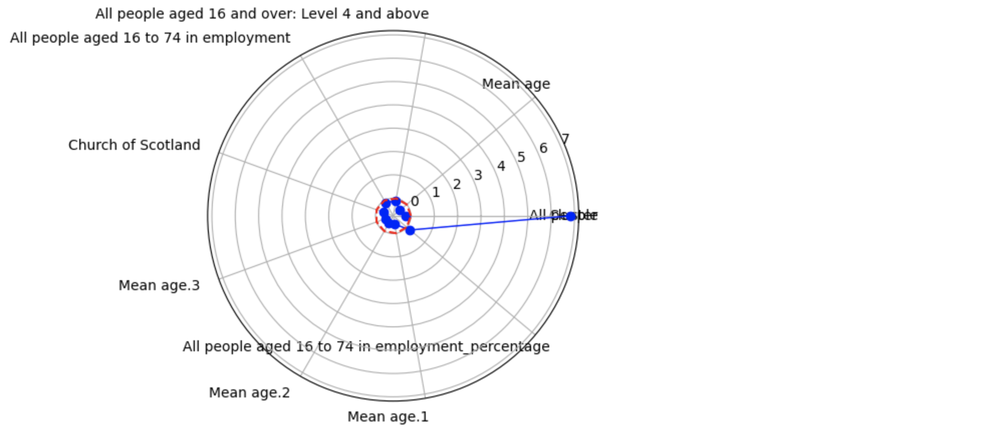

### Mapping the final cluster groups

In [226]:
list(z_score_df.columns)

['All people',
 'Mean age',
 'All people aged 16 and over: Level 4 and above',
 'All people aged 16 to 74 in employment',
 'Church of Scotland',
 'Mean age.3',
 'Mean age.2',
 'Mean age.1',
 'All people aged 16 to 74 in employment_percentage',
 'Cluster']

In [227]:
#Only keeping the clusters
z_score_df.drop([
 'All people',
 'Mean age',
 'All people aged 16 and over: Level 4 and above',
 'All people aged 16 to 74 in employment',
 'Church of Scotland',
 'Mean age.3',
 'Mean age.2',
 'Mean age.1',
 'All people aged 16 to 74 in employment_percentage'], axis=1, inplace=True)
z_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4322 entries, 0 to 4321
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Cluster  4322 non-null   int32
dtypes: int32(1)
memory usage: 17.0 KB


In [229]:
#Combining the resulting tables.
final_df = pd.concat([map_and_gdf, z_score_df], axis=1, ignore_index=False)
final_df.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,"Caribbean or Black: Black, Black Scottish or Black British.1",Caribbean or Black: Other Caribbean or Black.1,Other ethnic groups.1,"Other ethnic groups: Arab, Arab Scottish or Arab British.1",Other ethnic groups: Other ethnic group.1,Unnamed: 0.6,All people.3,Males.1,Females.1,Cluster
0,7307,S00104290,35,80,S12000036,0.005849,0.584871,EH6 8AJ,327509,675739,...,-,-,-,-,-,S00104290,80,42,38,6
1,7308,S00105247,50,134,S12000036,0.015458,1.545845,EH11 3UN,319980,671252,...,-,-,-,-,-,S00105247,134,69,65,7
2,7309,S00107429,45,72,S12000036,0.012086,1.208595,EH14 1DD,322954,670960,...,-,-,-,-,-,S00107429,72,30,42,5
3,7310,S00105740,45,104,S12000036,0.372084,37.208371,EH14 1DN,322537,669850,...,-,-,3,3,-,S00105740,104,49,55,1
4,7311,S00105450,46,87,S12000036,0.021571,2.157070,EH12 6AN,323001,673215,...,-,-,-,-,-,S00105450,87,38,49,6


In [199]:
print(final_df.crs)

None


In [233]:
final_df.set_crs('epsg:27700')

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,"Caribbean or Black: Black, Black Scottish or Black British.1",Caribbean or Black: Other Caribbean or Black.1,Other ethnic groups.1,"Other ethnic groups: Arab, Arab Scottish or Arab British.1",Other ethnic groups: Other ethnic group.1,Unnamed: 0.6,All people.3,Males.1,Females.1,Cluster
0,7307,S00104290,35,80,S12000036,0.005849,0.584871,EH6 8AJ,327509,675739,...,-,-,-,-,-,S00104290,80,42,38,6
1,7308,S00105247,50,134,S12000036,0.015458,1.545845,EH11 3UN,319980,671252,...,-,-,-,-,-,S00105247,134,69,65,7
2,7309,S00107429,45,72,S12000036,0.012086,1.208595,EH14 1DD,322954,670960,...,-,-,-,-,-,S00107429,72,30,42,5
3,7310,S00105740,45,104,S12000036,0.372084,37.208371,EH14 1DN,322537,669850,...,-,-,3,3,-,S00105740,104,49,55,1
4,7311,S00105450,46,87,S12000036,0.021571,2.157070,EH12 6AN,323001,673215,...,-,-,-,-,-,S00105450,87,38,49,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4317,18933,S00106411,25,52,S12000036,0.004296,0.429617,EH17 8PS,328998,668549,...,-,-,-,-,-,S00106411,52,20,32,0
4318,18934,S00103339,36,76,S12000036,0.089120,8.911963,EH1 3AT,325927,674069,...,-,-,-,-,-,S00103339,76,39,37,8
4319,18935,S00104795,40,75,S12000036,0.016734,1.673449,EH9 2AL,324943,671781,...,-,-,-,-,-,S00104795,75,33,42,1
4320,18936,S00103314,24,90,S12000036,0.002298,0.229771,EH1 1HB,325826,673220,...,-,-,-,-,-,S00103314,90,47,43,8


In [ ]:
final_df.explore(column='Cluster', cmap='Set1', tiles='CartoDB positron')

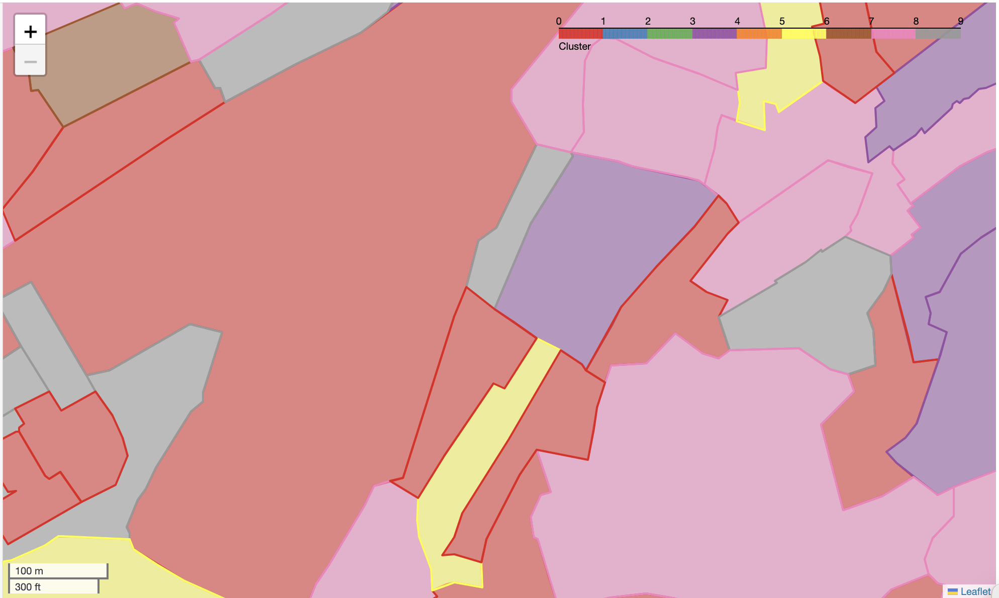

## Independent Research Project Summary

### Exploring patterns and trends of elections results of Malaysia's 15th General Election

**Political and Historical context**

During Malaysia’s 15th General Election, which occurred in 2022, the party that acquired the most seats (but are not in power, as Malaysia operates on a multi-party system) was the Malaysian Islamic Party, also known as PAS, who pride themselves in upholding conservative Muslim values. This election was also the first election to allow those aged 18-21 to vote, meaning that there was an additional 6 million eligible voters.

Throughout British Rule, the states of Colonial Malaya (now modern day Malaysia) were classified as either 1) Straits Settlement 2) Federated or 3) Unfederated, this ultimately determined the trajectory of these states’ development and largely explains present-day inequality.

**Problem to address**

It is interesting to see that despite the lowering of the voting age, PAS were able to obtain majority seats as a single party. Therefore, I would like to explore whether demographic and socio-economic factors are likely to influence voting patterns, and if so, which factors do. I would also like to explore whether historical factors, particularly colonialism, can be linked to these patterns

**Data and methods**

I plan on using the techniques learned in this module to map out the election results, demographic and socio-economic variables, as well as conduct correlation tests to investigate the relationship between election results and the variables, which I will also be mappinng. I also plan on potentially creating a linear regression model to further explore these relationships

I will be using data from Tindak Malaysia and the Department of Statistics Malaysia (DOSM). For the shapefile, I will be accessing the API of administrative boundaries through Stanford’s Digital Repository